In [60]:
import pandas as pd
import numpy as np
import hvplot.pandas
import matplotlib.pyplot as plt
%matplotlib inline

In [61]:
data_path = '../../data/'

In [62]:
tti = pd.read_csv(data_path + 'train_TTI.csv')
tti['time'] = pd.to_datetime(tti['time'])
tti.head()

,id_road,TTI,speed,time
0,276183,1.03472,69.6197,2019-01-01 00:00:00
1,276183,1.03506,69.6275,2019-01-01 00:10:00
2,276183,1.04166,69.1003,2019-01-01 00:20:00
3,276183,1.02642,70.1266,2019-01-01 00:30:00
4,276183,1.01442,70.9565,2019-01-01 00:40:00


In [63]:
tti.describe()

,id_road,TTI,speed
count,296198.000000,296198.000000,296198.000000
mean,276266.476084,1.384004,44.075114
std,242.550777,0.663539,14.193853
min,275911.000000,0.661631,1.073000
25%,276183.000000,1.096500,37.090150
50%,276241.000000,1.182850,43.149900
75%,276268.000000,1.433515,49.822425
max,276738.000000,48.910300,80.207900


In [64]:
len(tti['id_road'].unique()), tti['id_road'].value_counts()

(12, 276268    24747
 276241    24747
 276240    24747
 276184    24747
 276183    24747
 275912    24747
 275911    24747
 276264    24746
 276265    24742
 276269    24737
 276737    24649
 276738    24095
 Name: id_road, dtype: int64)

![title](../../data/image.jpg)
![title](../../data/road.jpg)

In [65]:
tti[tti['id_road']==276183]

,id_road,TTI,speed,time
0,276183,1.03472,69.6197,2019-01-01 00:00:00
1,276183,1.03506,69.6275,2019-01-01 00:10:00
2,276183,1.04166,69.1003,2019-01-01 00:20:00
3,276183,1.02642,70.1266,2019-01-01 00:30:00
4,276183,1.01442,70.9565,2019-01-01 00:40:00
...,...,...,...,...
24742,276183,1.40984,50.8710,2019-12-21 23:10:00
24743,276183,1.26799,56.5696,2019-12-21 23:20:00
24744,276183,1.18298,60.6349,2019-12-21 23:30:00
24745,276183,1.11711,64.2099,2019-12-21 23:40:00


In [66]:
tti[(tti['id_road']==276183) & (tti['time']<=pd.datetime(2019, 4, 10))].tail(), tti[(tti['id_road']==276183) & (tti['time']>=pd.datetime(2019, 9, 20))].head()

(       id_road      TTI    speed                time
 12937   276183  1.08655  66.6029 2019-03-31 23:10:00
 12938   276183  1.08740  66.5513 2019-03-31 23:20:00
 12939   276183  1.07410  67.3754 2019-03-31 23:30:00
 12940   276183  1.06053  68.2371 2019-03-31 23:40:00
 12941   276183  1.05733  68.5626 2019-03-31 23:50:00,
        id_road      TTI    speed                time
 12942   276183  1.11003  63.6867 2019-10-01 00:00:00
 12943   276183  1.09296  64.6037 2019-10-01 00:10:00
 12944   276183  1.08093  65.3620 2019-10-01 00:20:00
 12945   276183  1.08021  65.4077 2019-10-01 00:30:00
 12946   276183  1.04849  67.3436 2019-10-01 00:40:00)

## 数据的时间是 2019-01-01 到 2019-03-31 和 2019-10-01 到 2019-12-21， 时间粒度是10min

In [68]:
tti[tti['id_road']==276183].hvplot(x='time', y=['TTI'], figsize=(20, 10))

:Curve   [time]   (TTI)

In [96]:
tti_unstack = tti.set_index(['time', 'id_road'])['TTI'].unstack()
tti_unstack.reset_index(inplace=True)
tti_unstack.columns = tti_unstack.columns.astype(str)
tti_unstack.head()

id_road,time,275911,275912,276183,276184,276240,276241,276264,276265,276268,276269,276737,276738
0,2019-01-01 00:00:00,1.17708,1.04481,1.03472,1.04201,1.20657,0.969798,0.910685,1.22164,1.08408,1.06939,1.17226,1.22348
1,2019-01-01 00:10:00,1.20540,1.05131,1.03506,1.01898,1.08598,0.988317,0.943645,1.24548,1.10487,1.11199,1.28234,1.29453
2,2019-01-01 00:20:00,1.15301,1.06889,1.04166,1.03051,1.12628,0.989993,0.946696,1.25886,1.11909,1.13560,1.24146,1.06300
3,2019-01-01 00:30:00,1.16649,1.03028,1.02642,1.02516,1.07777,0.996718,0.967945,1.24712,1.09678,1.08550,1.23084,1.00236
4,2019-01-01 00:40:00,1.18073,1.08523,1.01442,1.00933,1.06748,0.997827,0.959714,1.23153,1.08452,1.06426,1.24097,1.10610


In [100]:
tti_unstack.hvplot(x='time', y=list(tti_unstack.columns).remove('time'), value_label='TTI', subplots=True, width=450, height=200).cols(2)

:NdLayout   [Variable]
   :Curve   [time]   (TTI)

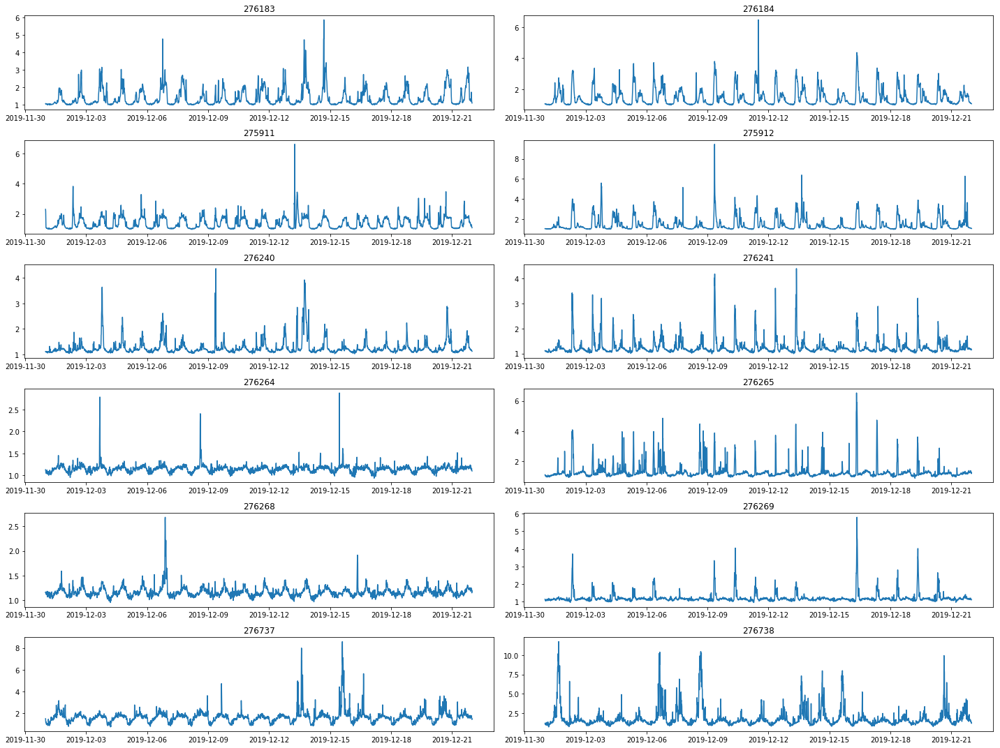

In [101]:
plt.figure(figsize=(20, 15))
for idx, id_road in enumerate(tti['id_road'].unique()):
    plt.subplot(6, 2, idx+1)
    road_data = tti[(tti['id_road']==id_road) & (tti['time']>=pd.datetime(2019, 12, 1)) & (tti['time']<pd.datetime(2019, 12, 31))]
    plt.plot(road_data['time'], road_data['TTI'])
    plt.title(id_road)
plt.tight_layout()